In [4]:
import numpy as np
import time
import os
import sys
import scipy
import math
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from scipy.interpolate import interp1d
import pandas as pd
import psutil
import json
from tqdm import tqdm
sys.path.insert(0, '/home/users/brezovec/.local/lib/python3.6/site-packages/lib/python/')
import ants
import bigbadbrain as bbb
from scipy.linalg import toeplitz
import scipy.linalg as sl
from scipy.signal import convolve2d
from scipy.signal import convolve
import sklearn
from sklearn.linear_model import LassoLarsIC
from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LassoCV
from sklearn.model_selection import KFold
from sklearn.feature_selection import RFE
from sklearn import linear_model

from skimage.filters import threshold_triangle
sys.path.insert(0, '/home/users/brezovec/.local/lib/python3.6/site-packages')
import os
import statsmodels.api as sm

from matplotlib.animation import FuncAnimation
from matplotlib import animation, rc
from IPython.display import HTML
from mpl_toolkits.mplot3d import Axes3D

import cv2

import umap
import hdbscan

%matplotlib inline

In [2]:
from matplotlib.patches import FancyArrowPatch
from mpl_toolkits.mplot3d import proj3d

class Arrow3D(FancyArrowPatch):
    def __init__(self, xs, ys, zs, *args, **kwargs):
        FancyArrowPatch.__init__(self, (0,0), (0,0), *args, **kwargs)
        self._verts3d = xs, ys, zs

    def draw(self, renderer):
        xs3d, ys3d, zs3d = self._verts3d
        xs, ys, zs = proj3d.proj_transform(xs3d, ys3d, zs3d, renderer.M)
        self.set_positions((xs[0],ys[0]),(xs[1],ys[1]))
        FancyArrowPatch.draw(self, renderer)

In [10]:
root_directory = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/20190101_walking_dataset/'

Duration: 0.05182385444641113
Duration: 16.998821020126343
Duration: 0.2539687156677246
Duration: 17.195676803588867
Duration: 0.36232829093933105
Duration: 23.07647395133972
Duration: 0.3698608875274658
Duration: 17.521650314331055
Duration: 0.06606745719909668
Duration: 22.358829021453857
Duration: 0.32872509956359863
Duration: 22.203745126724243
Duration: 0.2979769706726074
Duration: 22.19900345802307
Duration: 0.3395514488220215
Duration: 22.19984745979309
Duration: 0.3196866512298584
Duration: 23.47513747215271
Duration: 0.28964829444885254
Duration: 20.929262161254883


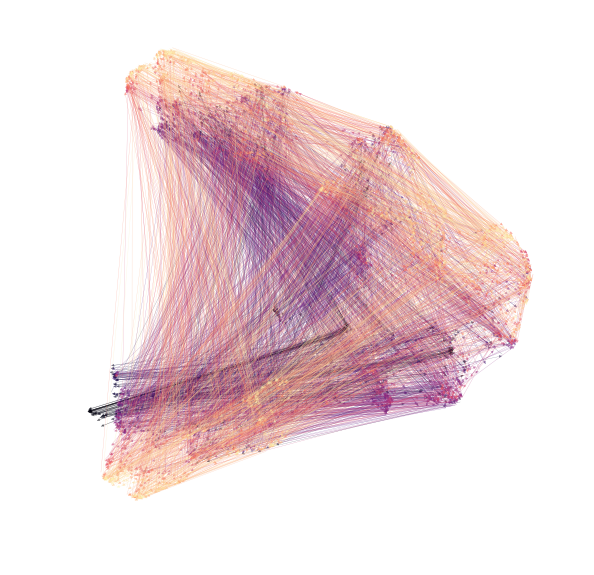

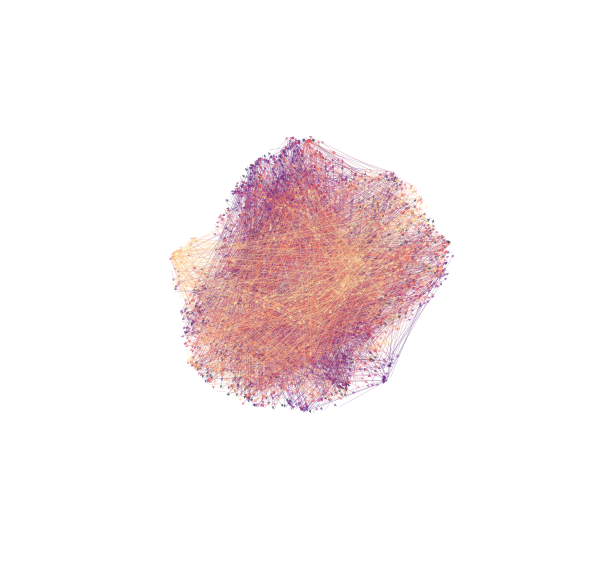

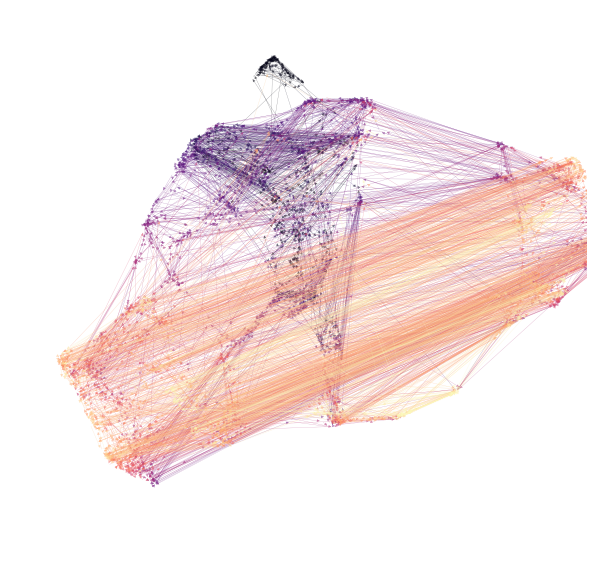

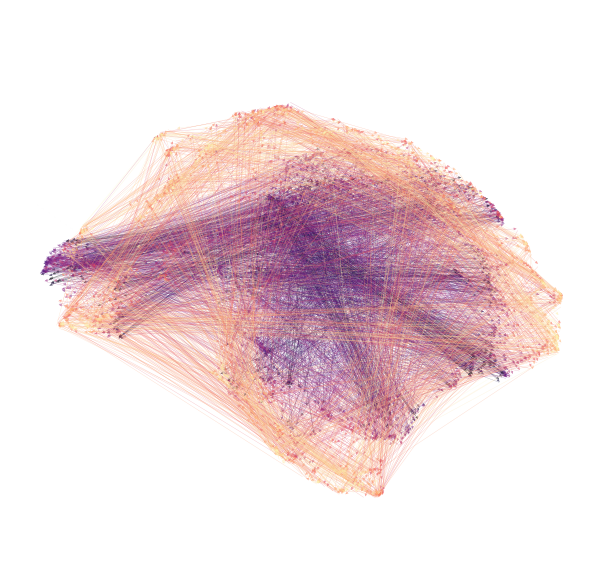

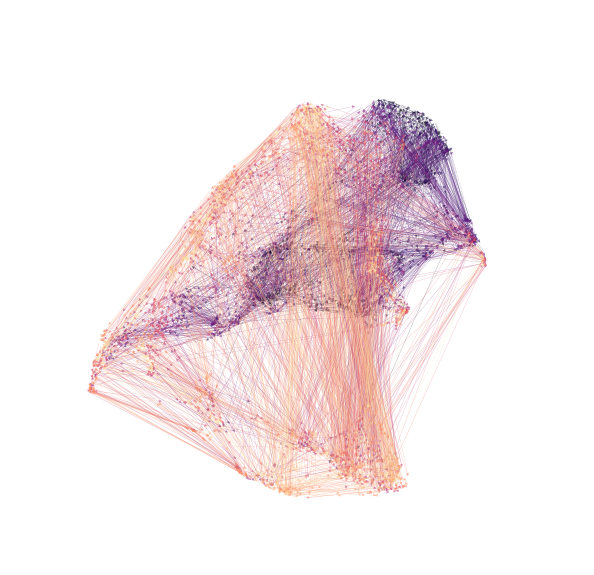

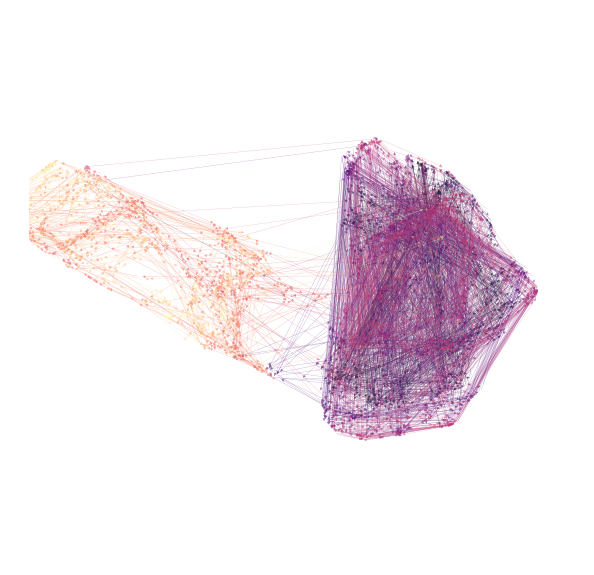

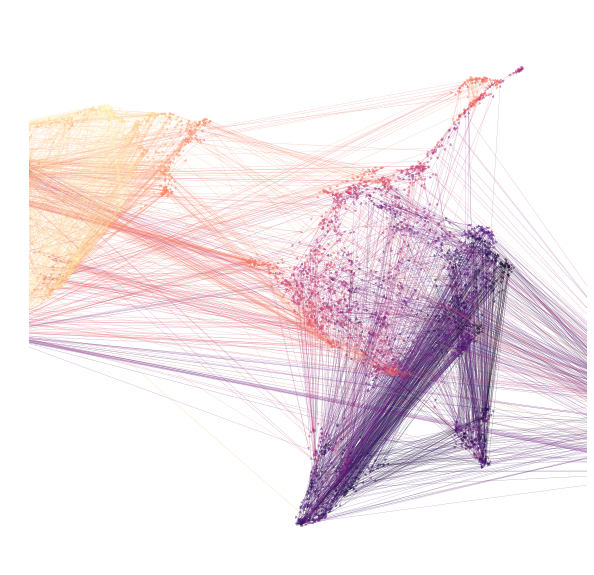

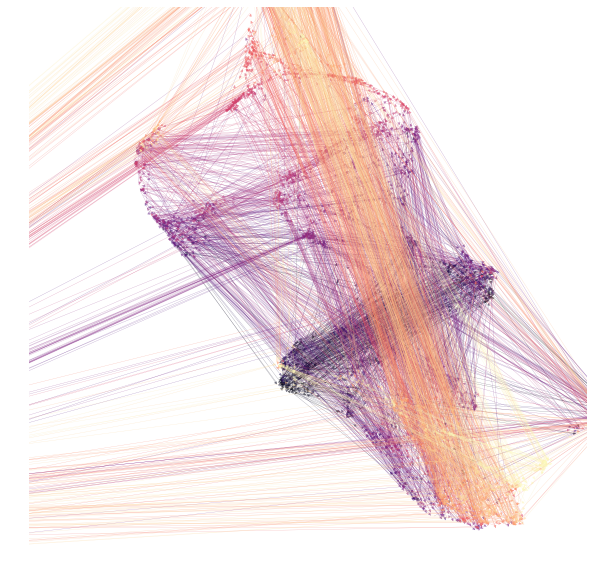

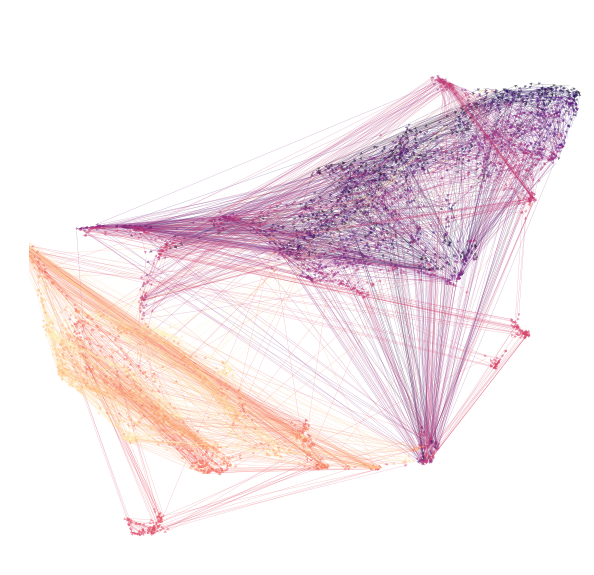

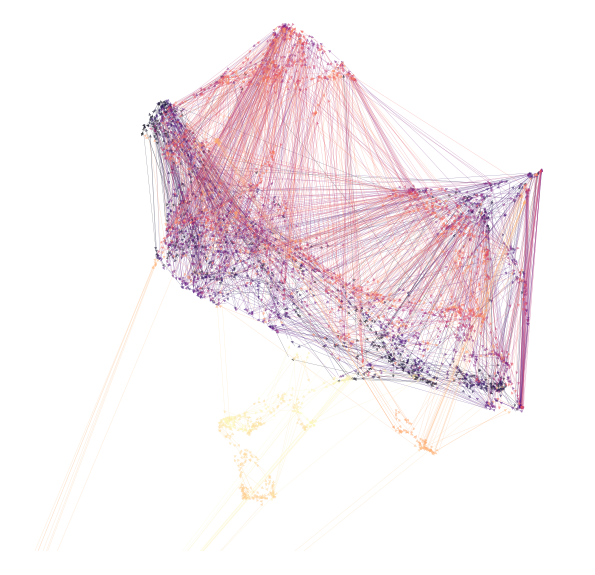

In [14]:
flies = [1,3,5,7,19,21,48,51,54,68]

for fly in flies:
    directory = os.path.join(root_directory, 'fly_{}'.format(fly), 'func_0')
    t0 = time.time()
    save_file = os.path.join(directory, 'pca', 'loadings_(temporal).npy')
    pca_loadings = np.load(save_file)
    print('Duration: {}'.format(time.time()-t0))

    t0 = time.time()
    reducer = umap.UMAP(n_neighbors=60,min_dist=0,n_components=2)
    X = reducer.fit_transform(pca_loadings[:,:10])
    print('Duration: {}'.format(time.time()-t0))

    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111)
    cmap = plt.cm.magma
    for i in range(X.shape[0]-1):
        alpha = .5
        color = cmap(float(i+1) / float(X.shape[0]))
        a = FancyArrowPatch(X[i,:],X[i+1,:],
                            mutation_scale=6,lw=0.25,arrowstyle="-|>",
                            color=color,alpha=alpha)
        ax.add_artist(a)
    window = 6
    center = np.mean(X,axis=0)
    ax.set_xlim(center[0]-window,center[0]+window)
    ax.set_ylim(center[1]-window,center[1]+window)
    plt.axis('off')
    save_path = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/figs'
    timestr = time.strftime("%Y%m%d-%H%M%S")
    fname = os.path.join(save_path, '{}_{}.png'.format(timestr,fly))
    plt.savefig(fname,dpi=300,bbox_inches='tight')

# Leave out single PCs

Duration: 0.06763291358947754
Duration: 21.97382664680481
Duration: 0.0632014274597168
Duration: 24.742709398269653
Duration: 0.06355047225952148
Duration: 22.23711657524109
Duration: 0.06282711029052734
Duration: 21.87680172920227
Duration: 0.06446242332458496
Duration: 22.509077787399292
Duration: 0.06336116790771484
Duration: 22.586971759796143
Duration: 0.06301689147949219
Duration: 22.3620023727417
Duration: 0.06266570091247559
Duration: 21.870020151138306
Duration: 0.06299495697021484
Duration: 21.941787004470825
Duration: 0.06267404556274414
Duration: 23.52011203765869


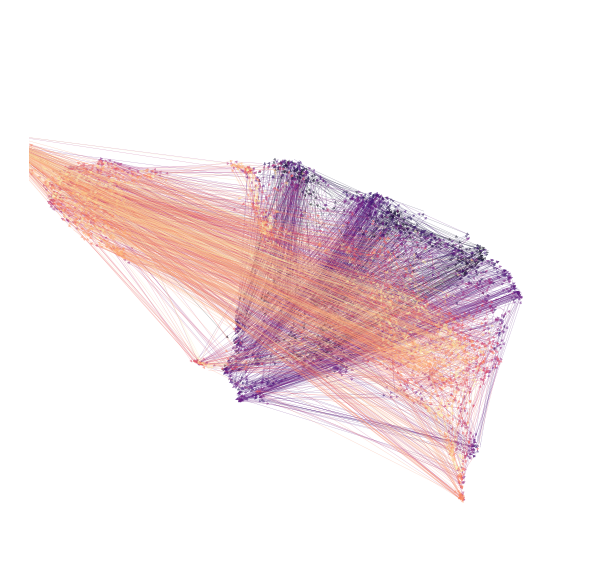

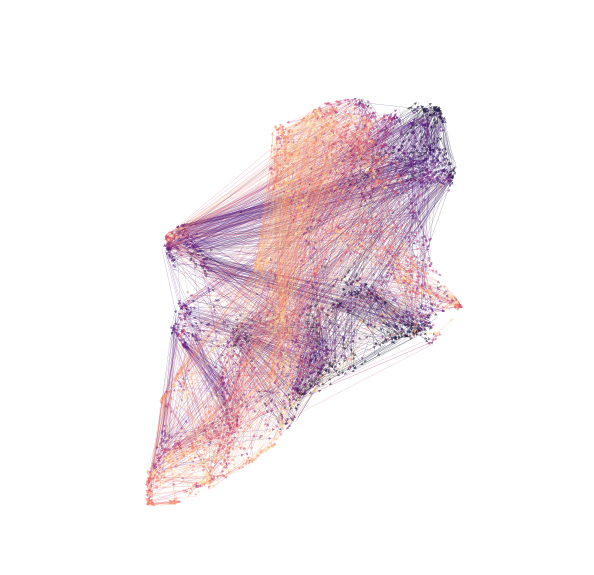

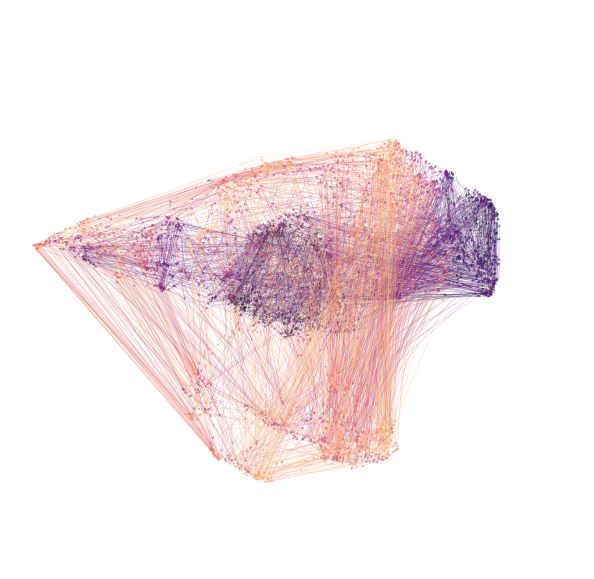

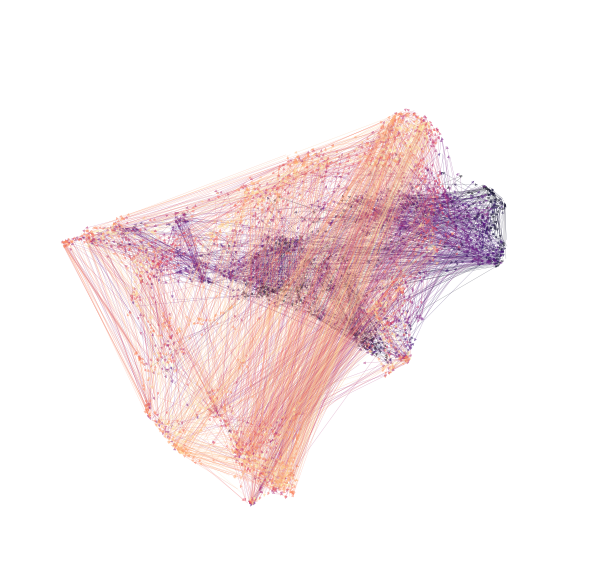

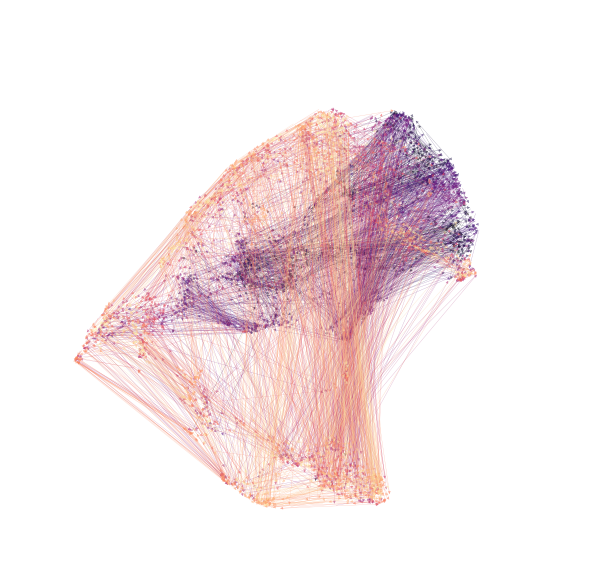

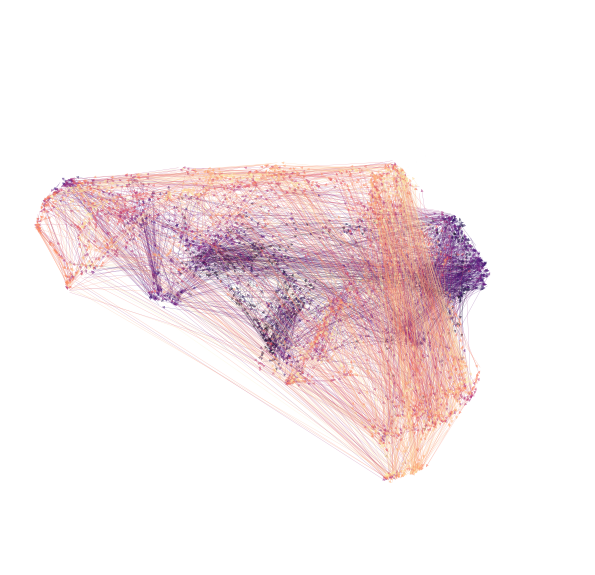

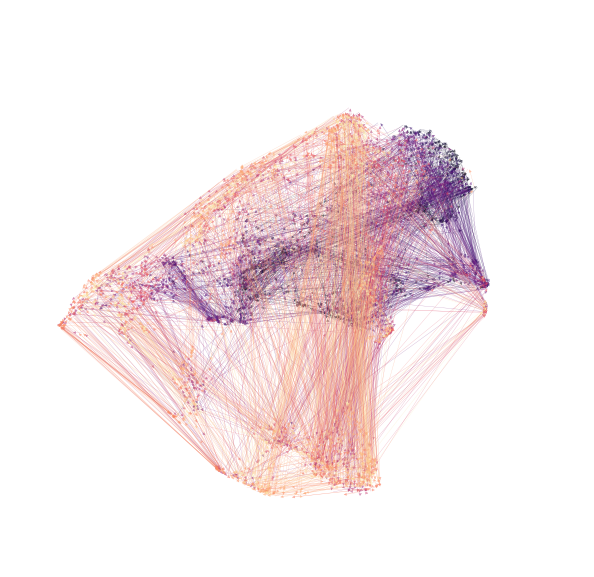

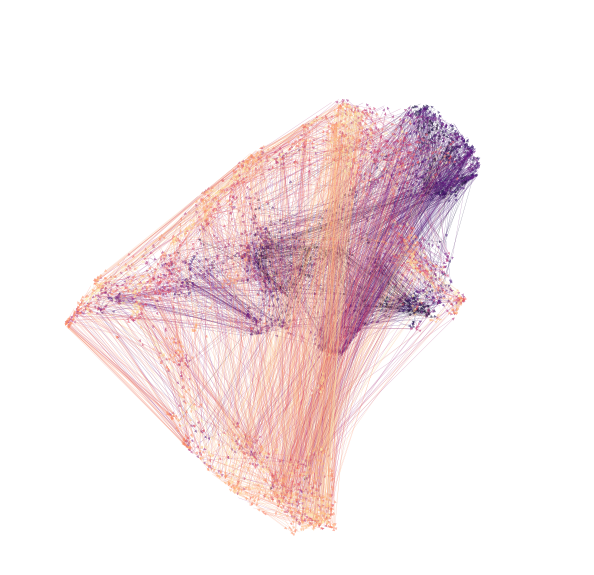

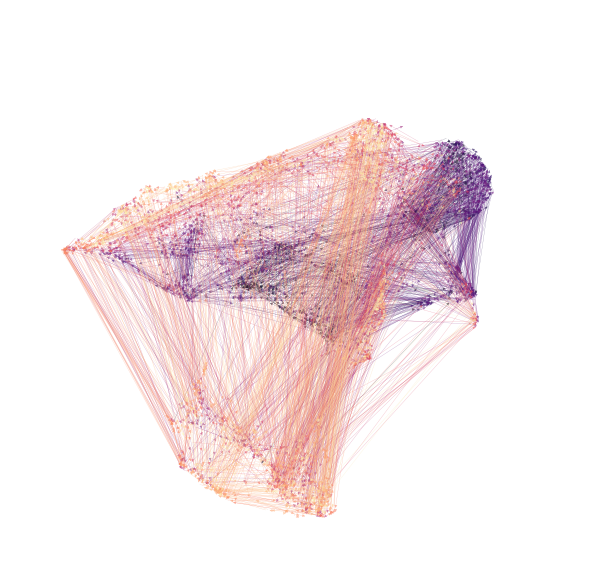

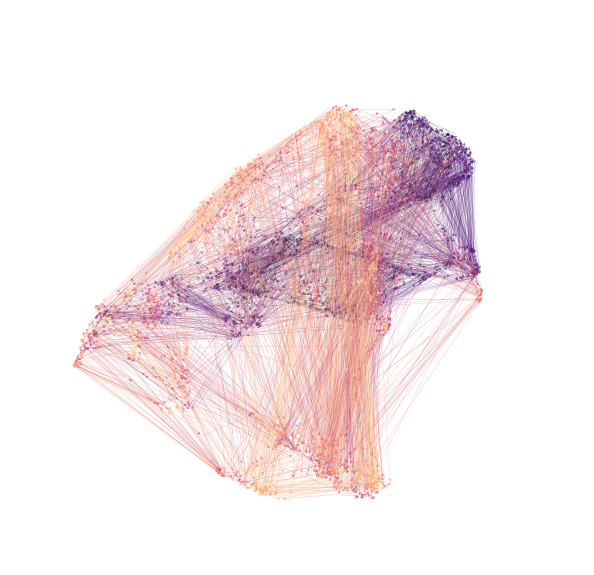

In [24]:
#flies = [1,3,5,7,19,21,48,51,54,68]
fly=19
for pc in range(10):
    directory = os.path.join(root_directory, 'fly_{}'.format(fly), 'func_0')
    t0 = time.time()
    save_file = os.path.join(directory, 'pca', 'loadings_(temporal).npy')
    pca_loadings = np.load(save_file)
    print('Duration: {}'.format(time.time()-t0))

    t0 = time.time()
    reducer = umap.UMAP(n_neighbors=60,min_dist=0,n_components=2)
    X = reducer.fit_transform(np.delete(pca_loadings[:,:10],pc,axis=-1))
    print('Duration: {}'.format(time.time()-t0))

    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111)
    cmap = plt.cm.magma
    for i in range(X.shape[0]-1):
        alpha = .5
        color = cmap(float(i+1) / float(X.shape[0]))
        a = FancyArrowPatch(X[i,:],X[i+1,:],
                            mutation_scale=6,lw=0.25,arrowstyle="-|>",
                            color=color,alpha=alpha)
        ax.add_artist(a)
    window = 6
    center = np.mean(X,axis=0)
    ax.set_xlim(center[0]-window,center[0]+window)
    ax.set_ylim(center[1]-window,center[1]+window)
    plt.axis('off')
    save_path = '/oak/stanford/groups/trc/data/Brezovec/2P_Imaging/figs'
    timestr = time.strftime("%Y%m%d-%H%M%S")
    fname = os.path.join(save_path, '{}_pc_leaveout_{}.png'.format(timestr,pc))
    plt.savefig(fname,dpi=300,bbox_inches='tight')

In [17]:
test = pca_loadings[:,:10]

In [20]:
out=np.delete(test,0,axis=-1)

In [21]:
out.shape

(4234, 9)

In [22]:
test.shape

(4234, 10)